<a href="https://colab.research.google.com/github/Gregory-crypto/transcriptome-analysis/blob/main/2_EM_%26_Callisto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EM for three clusters

In [ ]:
!gdown 17mf6RUEFOJ19t2zNuFlswSUs7MODwLlk

Downloading...
From: https://drive.google.com/uc?id=17mf6RUEFOJ19t2zNuFlswSUs7MODwLlk
To: /content/EM_dataset.csv
100% 12.6k/12.6k [00:00<00:00, 3.67MB/s]


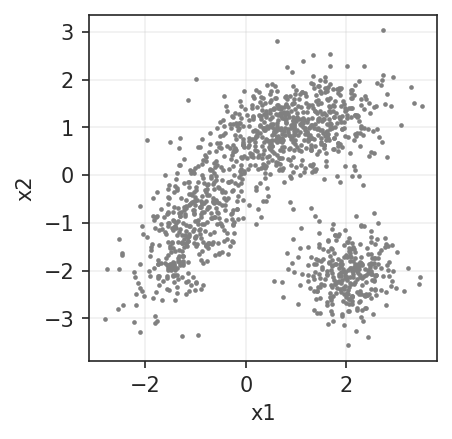

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

sns.set_style("ticks")
df = pd.read_csv("EM_dataset.csv")

# Adds another cluster with mean of 2, -2 and variance of 0.5
points = np.random.normal(loc=(2, -2), scale=0.5, size=(300, 2))
df1 = pd.DataFrame(points, columns=['x1', 'x2'])
df = pd.concat([df, df1], axis=0)

# Adds another cluster with mean of -2, 2.5 and variance of 0.5
# points = np.random.normal(loc=(-2, 2.5), scale=0.5, size=(300, 2))
# df2 = pd.DataFrame(points, columns=['x1', 'x2'])
# df = pd.concat([df, df2], axis=0)


fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
sns.scatterplot(x="x1", y="x2", data=df, s=5, color="grey", linewidth=0, ax=ax)
ax.grid(alpha=0.3)

In [ ]:
def get_random_psd(n=2):
    x = np.random.normal(0, 1, size=(n, n))
    return np.dot(x, x.transpose())

probs = np.random.random(3)

params = {
    "phi" : probs / np.sum(probs), # Доля точек, принадлежащих к кластеру 1

    "mu1" : np.random.normal(0, 1, size=2), # Центр распределения 1
    "mu2" : np.random.normal(0, 1, size=2), # Центр распределения 2
    "mu3" : np.random.normal(0, 1, size=2), # Центр распределения 3

    "sigma1": get_random_psd(), # У 2d Гауссианы таким образом задаётся дисперсия
    "sigma2" : get_random_psd(), # У 2d Гауссианы таким образом задаётся дисперсия
    "sigma3" : get_random_psd() # У 2d Гауссианы таким образом задаётся дисперсия
}

for param in params:
  print(f"{param}:")
  print(params[param], "\n")

phi:
[0.59375815 0.13090166 0.27534019] 

mu1:
[ 0.65995049 -0.8684568 ] 

mu2:
[-1.16328608 -0.14495205] 

mu3:
[-0.24518407 -0.99328166] 

sigma1:
[[ 6.72801437 -3.4426936 ]
 [-3.4426936   1.86416209]] 

sigma2:
[[0.75003912 0.13753625]
 [0.13753625 0.16726611]] 

sigma3:
[[6.2663607  2.2481244 ]
 [2.2481244  4.58559795]] 



Теперь отрисуем эти распределения (пока без точек):

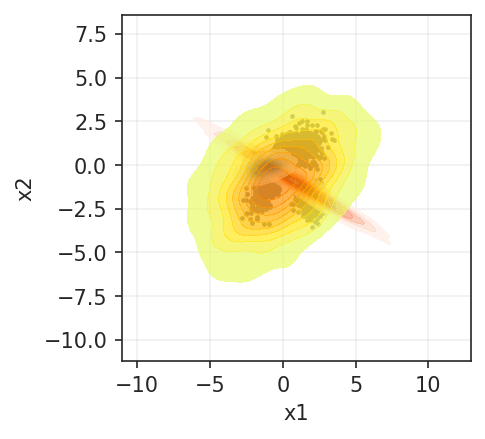

In [ ]:
import scipy.stats as stats

hist1 = stats.multivariate_normal(params["mu1"], params["sigma1"]).rvs(size=1000)
hist2 = stats.multivariate_normal(params["mu2"], params["sigma2"]).rvs(size=1000)
hist3 = stats.multivariate_normal(params["mu3"], params["sigma3"]).rvs(size=1000)

fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
sns.scatterplot(x="x1", y="x2", data=df, s=5, linewidth=0, ax=ax, color="grey")
sns.kdeplot(x=hist1[:, 0], y=hist1[:, 1], ax=ax, cmap="Reds", fill=True, alpha=0.7)
sns.kdeplot(x=hist2[:, 0], y=hist2[:, 1], ax=ax, cmap="Blues", fill=True, alpha=0.7)
sns.kdeplot(x=hist3[:, 0], y=hist3[:, 1], ax=ax, cmap="Wistia", fill=True, alpha=0.7)
ax.grid(alpha=0.3)

Итак, мы получили изначальные параметры, которые мы будем оптимизировать. Как происходит оптимизация этих параметров в EM-алгоритме? В целом логика примерно та же, что и в K-Means (для тех, кто знаком, если не знакомы &mdash; мы будем разбирать этот алгоритм в ходе курса позднее).

На E-шаге мы будем для каждой точки считать вероятности принадлежности каждой из точек к тому или иному кластеру.

$$b_i = P(b | x_i) = \frac{P(x_i|b)P(b)}{P(x_i|a)P(a) + P(x_i|b)P(b)} = \frac{(\mathrm{Likelihood\;of\;x_i\;from\;b} )*(\mathrm{Prior\;probability\;of\;b})}{\mathrm{Total\;probability\;of\;x_i}} = \frac{A * B}{C} = \frac{D}{C}$$

В логарифмической форме это будет выглядеть как $$\log{b_i} = \log{P(b_i|x)} = \log{P(x_i|b)} + \log{P(b)} - \log{(P(x_i|a)P(a) + P(x_i|b)P(b))} = \mathrm{LogLikelihood} + \mathrm{Prior} - \mathrm{Total\;probability} = \log{A} + \log{B} - \log{C}$$


In [ ]:
from scipy.special import logsumexp

X = df.values

def E_step(X, params, draw=False):
  LogLikelihood = A = np.log([
      stats.multivariate_normal(params["mu1"], params["sigma1"]).pdf(X),
      stats.multivariate_normal(params["mu2"], params["sigma2"]).pdf(X),
      stats.multivariate_normal(params["mu3"], params["sigma3"]).pdf(X)
  ])
  logPrior = B = np.log([params["phi"][0], params["phi"][1], params["phi"][2]])
  logPosterior = D = logPrior + LogLikelihood.T
  RealSoftMax = C = logsumexp(logPosterior, axis=1)
  probabilities = np.exp(logPosterior - np.array([RealSoftMax]).T)

  if draw:
    hist1 = stats.multivariate_normal(params["mu1"], params["sigma1"]).rvs(size=1000)
    hist2 = stats.multivariate_normal(params["mu2"], params["sigma2"]).rvs(size=1000)
    hist3 = stats.multivariate_normal(params["mu3"], params["sigma3"]).rvs(size=1000)

    fig, axes = plt.subplots(figsize=(6, 3), dpi=150, ncols=2, nrows=2)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=probabilities[:, 0], linewidth=0,
                    palette="coolwarm", ax=axes[0, 1], s=3, alpha=1)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=probabilities[:, 1], linewidth=0,
                    palette="coolwarm", ax=axes[1, 0], s=3, alpha=1)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=probabilities[:, 2], linewidth=0,
                    palette="coolwarm", ax=axes[1, 1], s=3, alpha=1)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], linewidth=0, ax=axes[0, 0], s=3, alpha=1, color="grey")
    sns.kdeplot(x=hist1[:, 0], y=hist1[:, 1], ax=axes[0, 0], cmap="Reds", fill=True, alpha=0.5)
    sns.kdeplot(x=hist2[:, 0], y=hist2[:, 1], ax=axes[0, 0], cmap="Blues", fill=True, alpha=0.5)
    sns.kdeplot(x=hist3[:, 0], y=hist3[:, 1], ax=axes[0, 0], cmap="Wistia", fill=True, alpha=0.5)
    axes[0, 0].grid(alpha=0.3)
    axes[0, 1].grid(alpha=0.3)
    axes[1, 0].grid(alpha=0.3)
    axes[1, 1].grid(alpha=0.3)
    axes[0, 1].legend().remove()
    axes[1, 0].legend().remove()
    axes[1, 1].legend().remove()
    axes[0, 0].set_xlim(-4, 4)
    axes[0, 1].set_xlim(-4, 4)
    axes[1, 0].set_xlim(-4, 4)
    axes[1, 1].set_xlim(-4, 4)
    axes[0, 0].set_ylim(-4, 4)
    axes[0, 1].set_ylim(-4, 4)
    axes[1, 0].set_ylim(-4, 4)
    axes[1, 1].set_ylim(-4, 4)
    plt.show()

  return RealSoftMax, probabilities

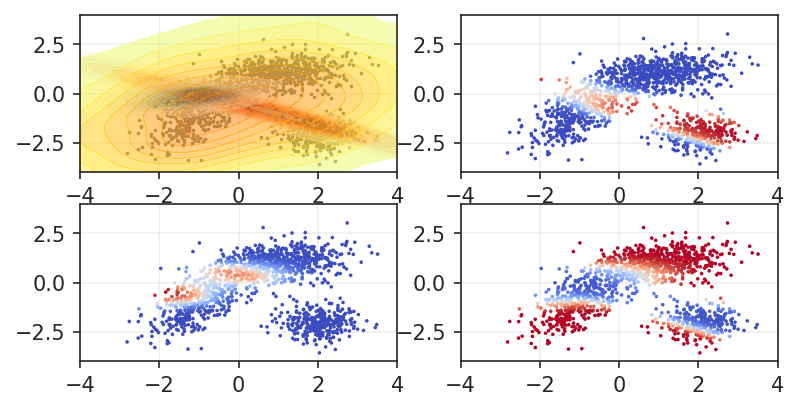

In [ ]:
total_prob, probabilities = E_step(X, params, draw=True)

На следующеи шаге мы будем оптимизировать параметр $\theta$ по тому, как мы определили принадлежность точек к кластерам на E-шаге.

In [ ]:
def M_step(X, params, probabilities):
  prob_1 = probabilities[:, 0]
  prob_2 = probabilities[:, 1]
  prob_3 = probabilities[:, 2]

  # Вычисление новых значений
  # Пропорция = prior
  phi = (prob_1.sum() / len(X), prob_2.sum() / len(X), prob_3.sum() / len(X))

  # Среднее
  mu1 = prob_1.dot(X) / np.sum(prob_1)
  mu2 = prob_2.dot(X) / np.sum(prob_2)
  mu3 = prob_3.dot(X) / np.sum(prob_3)

  # Дисперсия
  sigma1 = (X - mu1).T.dot((X - mu1) * np.array([prob_1]).T) / np.sum(prob_1)
  sigma2 = (X - mu2).T.dot((X - mu2) * np.array([prob_2]).T) / np.sum(prob_2)
  sigma3 = (X - mu3).T.dot((X - mu3) * np.array([prob_3]).T) / np.sum(prob_3)

  return {
      "phi" : phi,
      "mu1" : mu1, "mu2" : mu2, "mu3" : mu3,
      "sigma1": sigma1, "sigma2": sigma2, "sigma3": sigma3
  }

Сделаем так, чтобы это выполнялось до тех пор, пока LogLikelihood не перестанет уменьшаться меньше, чем на 0.0001.

In [ ]:
def run_EM(X, params, draw=False):
    import imageio
    avg_allprob = []

    while True:
        allprob, probabilities = E_step(X, params, draw=draw)
        avg_allprob.append(np.mean(allprob))
        if len(avg_allprob) > 2 and abs(avg_allprob[-1] - avg_allprob[-2]) < 0.00001:
            break
        params = M_step(X, params, probabilities)

    loglikelihood, probabilities = E_step(X, params)
    forecasts = np.argmax(probabilities, axis=1)
    return forecasts, probabilities, avg_allprob

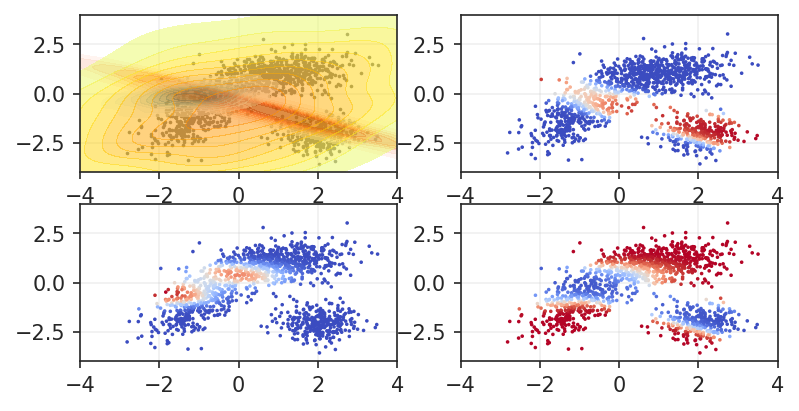

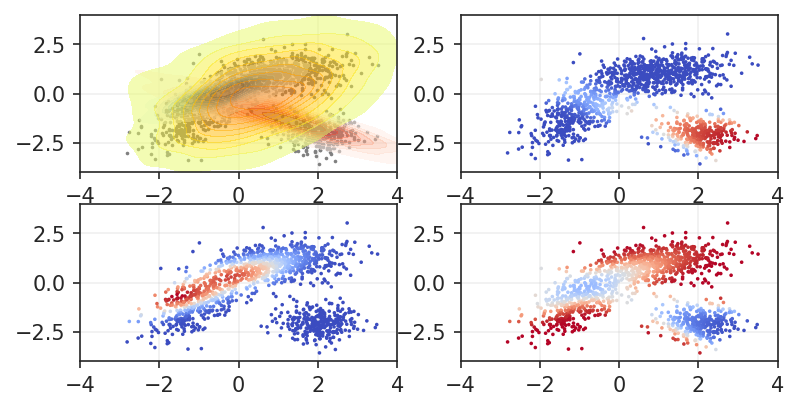

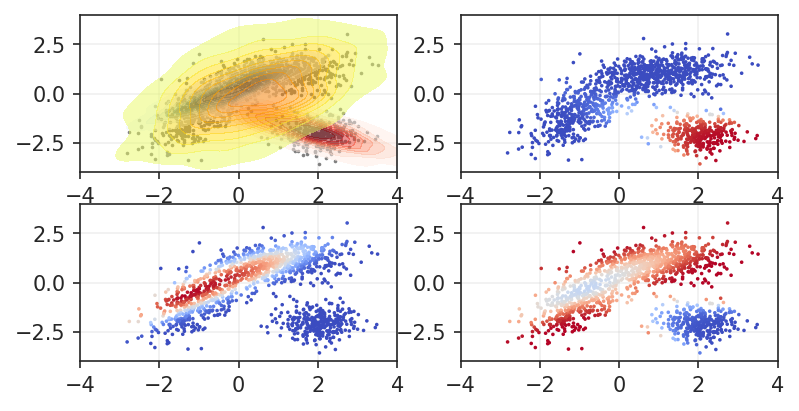

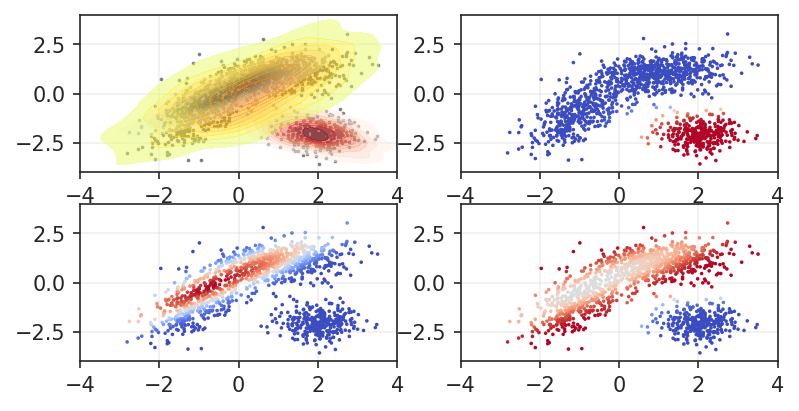

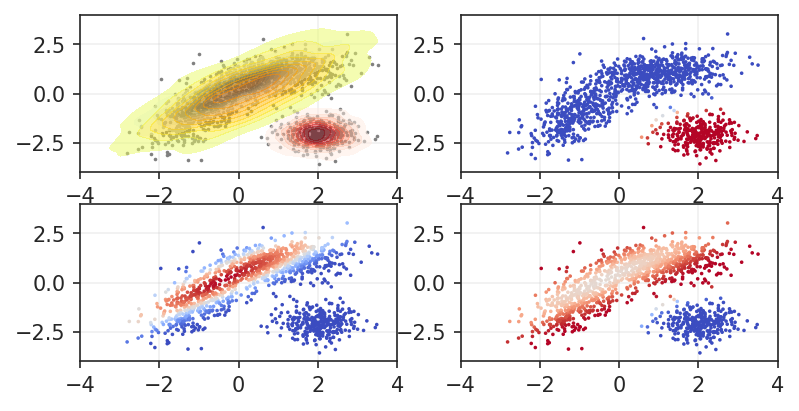

...

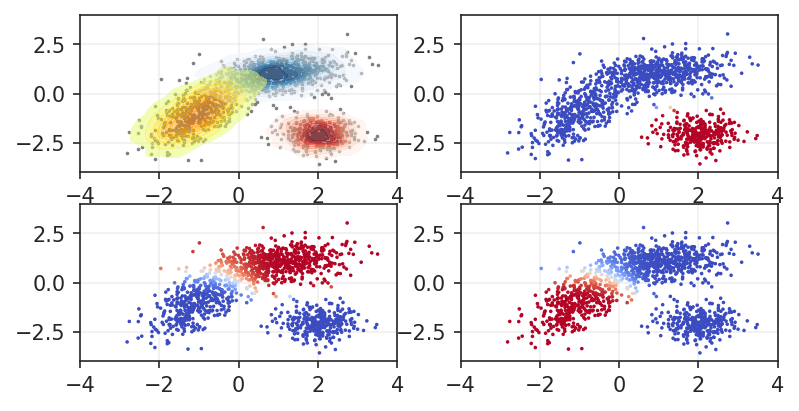

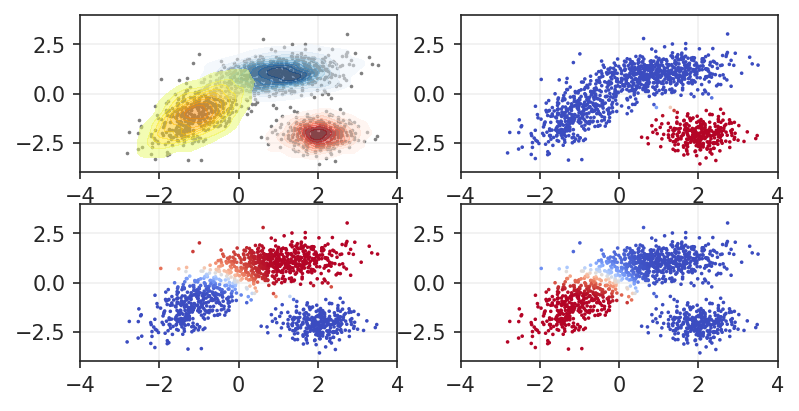

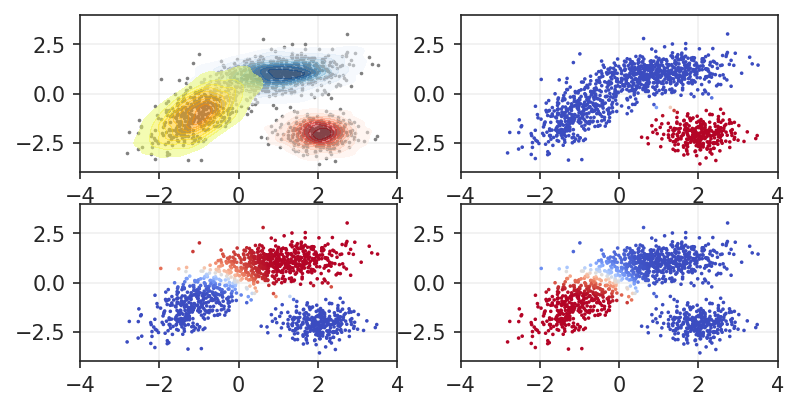

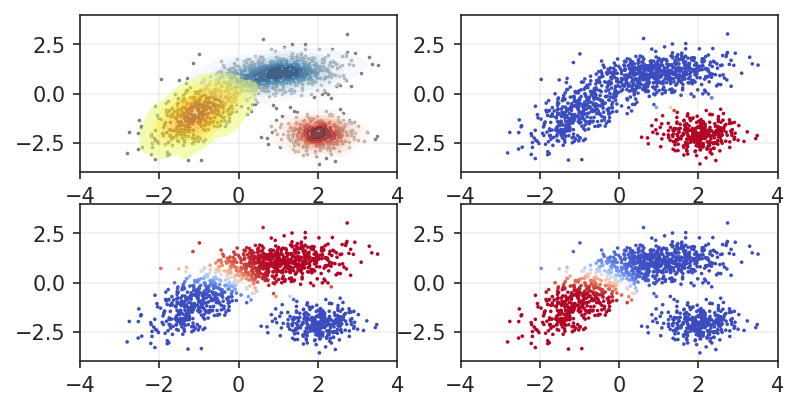

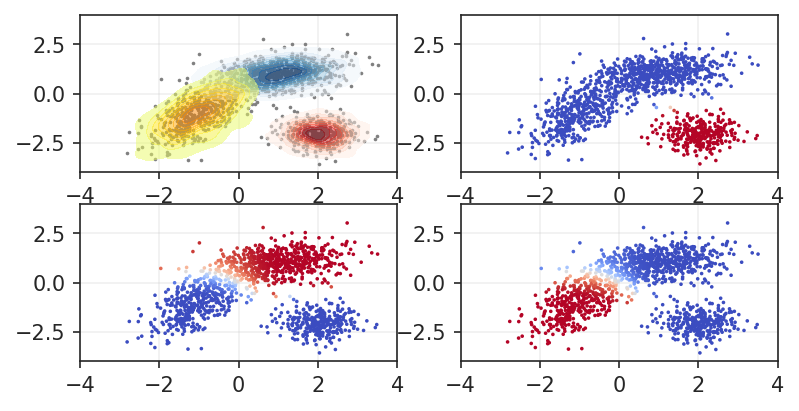

In [ ]:
pred, prob, allprob = run_EM(X, params, draw=True)

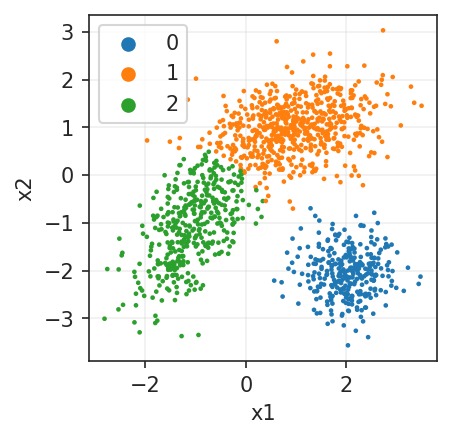

In [ ]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
sns.scatterplot(x="x1", y="x2", data=df, s=5, linewidth=0, ax=ax, hue=pred,
                palette={0: sns.color_palette("tab10", n_colors=50)[0],
                         1: sns.color_palette("tab10", n_colors=50)[1],
                         2: sns.color_palette("tab10", n_colors=50)[2]})
ax.grid(alpha=0.3)

# Callisto NF pipeline

###SRA-toolkit

In [ ]:
!wget https://ftp-trace.ncbi.nlm.nih.gov/sra/sdk/3.0.0/sratoolkit.3.0.0-ubuntu64.tar.gz
!tar -xvzf sratoolkit.3.0.0-ubuntu64.tar.gz

--2023-09-02 15:03:37--  https://ftp-trace.ncbi.nlm.nih.gov/sra/sdk/3.0.0/sratoolkit.3.0.0-ubuntu64.tar.gz
Resolving ftp-trace.ncbi.nlm.nih.gov (ftp-trace.ncbi.nlm.nih.gov)... 130.14.250.13, 165.112.9.228, 2607:f220:41e:250::7, ...
Connecting to ftp-trace.ncbi.nlm.nih.gov (ftp-trace.ncbi.nlm.nih.gov)|130.14.250.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 85777118 (82M) [application/x-gzip]
Saving to: ‘sratoolkit.3.0.0-ubuntu64.tar.gz.1’

sratoolkit.3.0.0-ub 100%[===================>]  81.80M  57.3MB/s    in 1.4s    

2023-09-02 15:03:38 (57.3 MB/s) - ‘sratoolkit.3.0.0-ubuntu64.tar.gz.1’ saved [85777118/85777118]

sratoolkit.3.0.0-ubuntu64/
sratoolkit.3.0.0-ubuntu64/bin/
sratoolkit.3.0.0-ubuntu64/bin/abi-dump
sratoolkit.3.0.0-ubuntu64/bin/abi-dump.3
sratoolkit.3.0.0-ubuntu64/bin/abi-load
sratoolkit.3.0.0-ubuntu64/bin/abi-load.3
sratoolkit.3.0.0-ubuntu64/bin/align-info
sratoolkit.3.0.0-ubuntu64/bin/align-info.3
sratoolkit.3.0.0-ubuntu64/bin/bam-load
srato

Configuration

In [ ]:
!sratoolkit.3.0.0-ubuntu64/bin/vdb-config -i

2023-09-02T15:03:46 vdb-config.3.0.0 fatal: SIGNAL - Segmentation fault 


### Kallisto

In [ ]:
!git clone https://github.com/pachterlab/kallisto.git
!apt-get install autoconf
!cd kallisto && mkdir build && cd build && cmake .. && make

fatal: destination path 'kallisto' already exists and is not an empty directory.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
autoconf is already the newest version (2.71-2).
0 upgraded, 0 newly installed, 0 to remove and 16 not upgraded.
mkdir: cannot create directory ‘build’: File exists


### Transcriptome

Downloading transcriptome

In [ ]:
!mkdir transcriptome

mkdir: cannot create directory ‘transcriptome’: File exists


In [ ]:
!curl "ftp://ftp.ensembl.org/pub/release-94/fasta/homo_sapiens/cdna/Homo_sapiens.GRCh38.cdna.all.fa.gz" -o /content/transcriptome/h38.fa.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 64.7M  100 64.7M    0     0  14.4M      0  0:00:04  0:00:04 --:--:-- 14.4M


In [ ]:
!./kallisto/build/src/kallisto index -i /content/transcriptome/transcriptome.idx /content/transcriptome/h38.fa.gz


[build] loading fasta file /content/transcriptome/h38.fa.gz
[build] k-mer length: 31
[build] warning: clipped off poly-A tail (longer than 10)
        from 1471 target sequences
[build] warning: replaced 5 non-ACGUT characters in the input sequence
        with pseudorandom nucleotides
KmerStream::KmerStream(): Start computing k-mer cardinality estimations (1/2)
KmerStream::KmerStream(): Start computing k-mer cardinality estimations (1/2)
KmerStream::KmerStream(): Finished
CompactedDBG::build(): Estimated number of k-mers occurring at least once: 108613141
CompactedDBG::build(): Estimated number of minimizer occurring at least once: 26591029
CompactedDBG::filter(): Processed 304594999 k-mers in 187626 reads
CompactedDBG::filter(): Found 108523967 unique k-mers
CompactedDBG::filter(): Number of blocks in Bloom filter is 742474
CompactedDBG::construct(): Extract approximate unitigs (1/2)
CompactedDBG::construct(): Extract approximate unitigs (2/2)
CompactedDBG::construct(): Closed all i

### Nextflow

In [ ]:
!curl -fsSL https://get.nextflow.io | bash


      N E X T F L O W
      version 23.04.3 build 5875
      created 11-08-2023 18:37 UTC 
      cite doi:10.1038/nbt.3820
      http://nextflow.io


Nextflow installation completed. Please note:
- the executable file `nextflow` has been created in the folder: /content
- you may complete the installation by moving it to a directory in your $PATH



СХЕМА PIPELINE
- В команду fastq-dump добавлен параметр -X 10000 для быстродействия, для работы рекомендуется убрать

```
params.results_dir = "results/"
params.INDEX = "/content/transcriptome/transcriptome.idx"
SRA_list = params.SRA.split(",")

log.info ""
log.info "  Q U A L I T Y   C O N T R O L  "
log.info "================================="
log.info "SRA number         : ${SRA_list}"
log.info "Index file         : ${params.INDEX}"
log.info "Results location   : ${params.results_dir}"

process DownloadFastQ {
  publishDir "${params.results_dir}"

  input:
    val sra

  output:
    path "${sra}/*"

  script:
    """
       /content/sratoolkit.3.0.0-ubuntu64/bin/fastq-dump ${sra} -X 10000 --split-3 -O ${sra}/
    """
}

  process Callisto {
    publishDir "${params.results_dir}"
    input:
      path x
    
    output:
      path "alignment/*"
    
    script:
    """
      mkdir alignment
      /content/kallisto/build/src/kallisto quant -i ${params.INDEX} -o alignment $x
    """
  }

workflow {
  data = Channel.of( SRA_list)
  DownloadFastQ(data)
  Callisto(DownloadFastQ.out)
}
```

In [ ]:
!touch kallisto.nf

### Выведение результатов

In [ ]:
!./nextflow run kallisto.nf -with-report nextflow_report.html -with-dag flowchart.pdf --SRA SRR6410603,SRR6410604 --INDEX /content/transcriptome/transcriptome.idx

N E X T F L O W  ~  version 23.04.3
Launching `kallisto.nf` [zen_kilby] DSL2 - revision: 200e01911b

  Q U A L I T Y   C O N T R O L  
SRA number         : [SRR6410603, SRR6410604]
Index file         : /content/transcriptome/transcriptome.idx
Results location   : results/
[-        ] process > DownloadFastQ -
[-        ] process > Callisto      -

executor >  local (2)
[e4/9be09b] process > DownloadFastQ (2) [  0%] 0 of 2
[-        ] process > Callisto          -

executor >  local (2)
[e4/9be09b] process > DownloadFastQ (2) [  0%] 0 of 2
[-        ] process > Callisto          -

executor >  local (2)
[e4/9be09b] process > DownloadFastQ (2) [ 50%] 1 of 2
[-        ] process > Callisto          [  0%] 0 of 1

executor >  local (3)
[e4/9be09b] process > DownloadFastQ (2) [ 50%] 1 of 2
[85/841f95] process > Callisto (1)      [  0%] 0 of 1

executor >  local (4)
[29/5c61d4] process > DownloadFastQ (1) [100%] 2 of 2 ✔
[08/1365d2] process > Callisto (2)      [  0%] 0 of 2

executor >  local